# Précipitations totales

Inspiré du site https://pulse.climate.copernicus.eu/
Ce cahier trace l'évolution des anomalies de précipitations
* Documentation : données ERA 5 mensuelles https://cds.climate.copernicus.eu/datasets/reanalysis-era5-single-levels-monthly-means?tab=documentation
* Source des données : https://cds.climate.copernicus.eu/datasets/reanalysis-era5-single-levels-monthly-means?tab=overview
* Pour faire fonctionner le script, il faut créer un compte CDS et un fichier de configuration '.cdsapirc' avec deux lignes pour que l'API du CDS fonctionne :
- url: https://cds.climate.copernicus.eu/api
- key: votre clé de 36 caractères
* données supplémentaires à télécharger pour les frontières dans imshow :  https://www.naturalearthdata.com/downloads/50m-cultural-vectors/

In [46]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['animation.embed_limit'] = 80
from matplotlib.animation import FuncAnimation
import matplotlib.gridspec as gridspec
import matplotlib.colors as colors

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np

import os
from pathlib import Path 
import xarray as xr
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cdsapi
import calendar

# Mes dossiers sur la machine windows
répertoire_données   = r"D:\Data\data_copernicus\precipitation_monthly"
répertoire_principal = r"D:\Data\data_copernicus"
répertoire_animation = r"D:\Data\data_copernicus\data_animation\precipitation"

## fonctions de calcul

In [24]:
def jours_par_mois(annee):
    """Retourne le nombre de jours pour chaque mois d'une année donnée"""
    return [calendar.monthrange(annee, mois)[1] for mois in range(1, 13)]

def calculer_moyenne(fichier='era5_precipitation_climatology_1991_2020.nc', extension=[70, -10, 30, 40],
                     répertoire_principal = répertoire_données, verbosité = True, unité_pluie = True,an_début = 1991,durée = 30):
    """
    Charge ou télécharge les données de précipitation ERA5 pour 1991--2020
    et calcule la précipitation mensuelle moyenne. Le DCS fournit une valeur de précipitations sous la forme de précipitation moyenne journalière en mm/jour.
    L'unité employée par le CDS est donc fausse. On fait ici la conversion en mm/mois.
    Entrées 
    * fichier à lire ou créer
    * extension : lat_max,lon_min, lat_min, lon_max. Par défaut : extension = [70, -10, 30, 40]. C'est le format (bizarre) du CDS !
    * répertoire_principal : où placer les données
    * verbosité : Boolean. Si True, affiche les messages (pour le débogage)
    * unité_pluie : Boolean. Si True, l'unité est en mm/mois sinon elle est en mm/jour
    * an_début : début de la période de référence. Par défaut 1991
    * durée : durée de la période de référence. Par défaut 30 ans
    Sortie
    """
    # teste si le répertoire existe
    if not os.path.exists(répertoire_principal):
        os.makedirs(répertoire_principal)
    if verbosité: print("J'ai créé le répertoire : ", répertoire_principal)
   
    nom_complet = Path(répertoire_principal) / fichier
    if not nom_complet.exists():
        os.chdir(répertoire_principal)
        if verbosité: print("* Téléchargement des données de référence climatologique...")
        c = cdsapi.Client()
        c.retrieve(
            "reanalysis-era5-single-levels-monthly-means",
            {
                "product_type": "monthly_averaged_reanalysis",
                "variable": "total_precipitation",
                "year": [str(an) for an in range(an_début, an_début+durée)],
                "month": [f"{mois:02d}" for mois in range(1, 13)],
                "time": "00:00",
                "format": "netcdf",
                "area": extension
            },
            fichier
        )
    else:
        if verbosité: print(f"* J'ai trouvé le fichier {fichier} et l'ai chargé...")
    
    ds = xr.open_dataset(nom_complet)
    ds.load()
    if verbosité: print(f"* Unité initiale de la variable tp : {ds.tp.GRIB_units}")
    if verbosité: print(f"* Période de référence: {an_début}-{an_début+durée}")
    # Convertir en mm/jour
    ds['tp'] = ds['tp'] * 1000
    
    # Calculer le nombre de jours pour chaque mois directement
    annees = ds.valid_time.dt.year
    mois = ds.valid_time.dt.month
    
    # Créer un array avec le nombre de jours pour chaque timestamp
    jours_par_mois = xr.apply_ufunc(
        lambda y, m: calendar.monthrange(int(y), int(m))[1],
        annees, mois,
        vectorize=True,
        dask="allowed"
    )
    
    # Convertir en totaux mensuels (mm/mois)
    ds['tp_total'] = ds['tp'] * jours_par_mois
    ds['tp_total'].attrs['units'] = 'mm/month'
    
    # Calculer la moyenne des totaux mensuels par mois de l'année
    moyenne_totaux = ds.tp_total.groupby("valid_time.month").mean('valid_time')
    
    # Calculer le nombre moyen de jours pour chaque mois sur la période de référence
    jours_moyens_par_mois = []
    for mois_num in range(1, 13):
        # Calculer le nombre moyen de jours pour ce mois sur la période
        jours_mois = [calendar.monthrange(an, mois_num)[1] for an in range(an_début, an_début+durée)]
        jours_moyens_par_mois.append(np.mean(jours_mois))
    
    jours_moyens = xr.DataArray(
        jours_moyens_par_mois, 
        dims=['month'], 
        coords=[range(1, 13)]
    )
    
    # Moyenne en mm/jour
    moyenne_mm_jour = moyenne_totaux / jours_moyens
    moyenne_mm_jour.attrs['units'] = 'mm/day'
    
    if verbosité:
        print(f"* Nombre moyen de jours en février (sur la période {an_début}-{an_début+durée}): {jours_moyens[1].values:.2f}")
        if unité_pluie: 
            print(f"* Unité finale : {moyenne_totaux.attrs['units']}") 
        else: 
            print(f"* Unité finale : {moyenne_mm_jour.attrs['units']}")
    if unité_pluie:
        return moyenne_totaux 
    else:
        return moyenne_mm_jour

################################################################################################################
def calculer_anomalie_precipitation(an, moyenne, extension=[70, -10, 30, 40], 
                                  répertoire = répertoire_données,  verbosité = True):
    """
    Calcule les anomalies de précipitation pour une année donnée par rapport à la climatologie fournie.
    Entrées : 
    * année : integer (entre 1940 et 2024)
    * moyenne : xarray avec le cumul moyen de précipitations sur la période de référence
    Sorties :
    * data_relatives : dictionnaire ('lat','lon', 'anomalie') anomalie en % par rapport à la période de référence
    * data_anomalies : dictionnaire ('lat','lon', 'anomalie') anomalie en mm par rapport à la période de référence
    * data_absolues  : dictionnaire ('lat','lon', 'absolue') valeur absolue pour l'année 'an'
    """
    nom_fichier_complet = Path(répertoire) / f"era5_precip_{an}.nc"

    #filename = os.path.join(data_dir, f"era5_precip_{year}.nc")

    if not os.path.exists(nom_fichier_complet):
        print(f"* Téléchargement des données ERA5 pour {an}...")
        import cdsapi
        c = cdsapi.Client()
        c.retrieve(
            "reanalysis-era5-single-levels-monthly-means",
            {
                "product_type": "monthly_averaged_reanalysis",
                "variable": "total_precipitation",
                "year": str(an),
                "month": [f"{mois:02d}" for mois in range(1, 13)],
                "time": "00:00",
                "format": "netcdf",
                "area": extension
            },
            nom_fichier_complet
        )
    else:
        if verbosité: print(f"* J'ai trouvé le fichier {nom_fichier_complet} et l'ai chargé.")

    ds = xr.open_dataset(nom_fichier_complet)
    ds.load()
    # Créer un DataArray avec le nombre de jours par mois
    nb_jours_da = xr.DataArray(
        jours_par_mois(an), 
        dims=['valid_time'], 
        coords=[ds.valid_time]
    )

    # Conversion directe
    ds['tp_mm_total'] = ds['tp'] * 1000 * nb_jours_da
    ds['tp_mm_total'].attrs['units'] = 'mm/month'

    # Calculer l'anomalie mois par mois
    def anomalie_mensuelle(groupe):
        mois = groupe.valid_time.dt.month[0].item()
        return groupe- moyenne.sel(month=mois) 
 
    # Groupement par mois et calcul de l'anomalie
    precip_mensuelle = ds['tp_mm_total']
    anomalies = precip_mensuelle.groupby('valid_time.month').apply(anomalie_mensuelle)
    # Sommation pour avoir l'écart annuel
    anomalies_totales  = anomalies.sum("valid_time") 
    cumul_annuel       = precip_mensuelle.sum("valid_time") 
    anomalie_relatives = anomalies_totales / cumul_annuel*100

    if verbosité: 
        print(f"* Anomalies {an} calculées :")
        print(f"   - Résolution: {len(ds.latitude)} x {len(ds.longitude)} points")
        print(f"   - Valeurs  min et max: {float(cumul_annuel.min()):.1f} mm et {float(cumul_annuel.max()):.1f} mm")
        print(f"   - Anomalies min et max: {float(anomalies_totales.min()):.1f} mm et {float(anomalies_totales.max()):.1f} mm")
        print(f"   - Anomalies relatives min et max: {float(anomalie_relatives.min()):.1f} % et {float(anomalie_relatives.max()):.1f} %")

    # Mise en forme des données
    lats_2d, lons_2d = np.meshgrid(ds.latitude.values, ds.longitude.values, indexing='ij')
    anomalies_flat = anomalies_totales.values.flatten()

    masque = ~np.isnan(anomalies_flat)
    data_anomalies = {
        'lat': lats_2d.flatten()[masque],
        'lon': lons_2d.flatten()[masque],
        'anomalie': anomalies_flat[masque]
    }

    cumul_annuel_flat = cumul_annuel.values.flatten()
    masque = ~np.isnan(cumul_annuel_flat)
    data_absolues = {
        'lat': lats_2d.flatten()[masque],
        'lon': lons_2d.flatten()[masque],
        'absolue': cumul_annuel_flat[masque]
    }

    anomalie_relatives_flat = anomalie_relatives.values.flatten()
    masque = ~np.isnan(anomalie_relatives_flat)
    data_relatives = {
        'lat': lats_2d.flatten()[masque],
        'lon': lons_2d.flatten()[masque],
        'anomalie': anomalie_relatives_flat[masque]
    }

    return data_relatives, data_anomalies, data_absolues


## fonction graphiques

In [ ]:
def tracer_precipitation_anomalies(data, cmap='RdBu', vmin=-100, vmax=100,extension=(30, 70, -10, 40)):
    """
    Affiche les anomalies de précipitation sur une projection géo ou orthographique centrée sur l'Europe.
    Entrées :
    * dictionnaire avec pour clés 'lat', 'lon' et 'anomalie'"Atelier écriture"
    * cmap : color map, par défaut 'RdBu'
    * vmin=-100, vmax=100 : valeurs minimales et maximales de la barre de couleur 
    * extension=(30, 70, -10, 40) lat_min, lat_max, lon_min, lon_max
    """
    fig = plt.figure(figsize=(10, 10)) 
    #center_lon=10, center_lat=50, 
    #ax = plt.axes(projection=ccrs.Orthographic(central_longitude=center_lon, central_latitude=center_lat))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([extension[2], extension[3], extension[0], extension[1]], crs=ccrs.PlateCarree())
    # Ajouter les côtes uniquement (sans fond terrestre)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5, edgecolor='gray')
    ax.add_feature(cfeature.BORDERS, linewidth=0.5, edgecolor='gray')
    # Convertir les coordonnées en projection
    sc = ax.scatter(
        data['lon'], data['lat'],
        c=data['anomalie'],
        cmap=cmap,
        s=10,
        vmin=vmin,
        vmax=vmax,
        transform=ccrs.PlateCarree(),
        alpha=0.85
    )
    # Légende (barre de couleur)
    cb = plt.colorbar(sc, orientation='horizontal', shrink=0.7, pad=0.05)
    cb.set_label("Anomalie de précipitation (%)")
    plt.tight_layout()
    plt.show()

def tabuler_precipitation_anomalies(data, an, ax, cmap='RdBu', vmin=-100, vmax=100,extension=(30, 70, -10, 40),légende = False):
    """
    Affiche les anomalies de précipitation 'data' correspondant à l'année 'an' pour l'axe 'ax' d'une grille
    sur une projection géo ou orthographique centrée sur l'Europe.
    Entrées :
    * dictionnaire avec pour clés 'lat', 'lon' et 'anomalie'"Atelier écriture"
    * cmap : color map, par défaut 'RdBu'
    * vmin=-100, vmax=100 : valeurs minimales et maximales de la barre de couleur 
    * extension=(30, 70, -10, 40) lat_min, lat_max, lon_min, lon_max
    * légende : Boolean. Ajoute un légende sous la forme d'une barre de couleurs
    Sortie :
    * sc : scatter plot (pour faire une barre de couleurs globale)
    """
 
    ax.set_extent([extension[2], extension[3], extension[0], extension[1]], crs=ccrs.PlateCarree()) 
    # Ajouter les côtes   et frontières
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5, edgecolor='gray')
    ax.add_feature(cfeature.BORDERS, linewidth=0.5, edgecolor='gray')
    # Convertir les coordonnées en projection
    sc = ax.scatter(
        data['lon'], data['lat'],
        c=data['anomalie'],
        cmap=cmap,
        s=10,
        vmin=vmin,
        vmax=vmax,
        transform=ccrs.PlateCarree(),
        alpha=0.85
    )

    ax.text(0.1, 0.1,  str(an),
        horizontalalignment='center',
        verticalalignment='center',
        transform = ax.transAxes,fontsize=12)

    # Ajouter une barre de couleur
    if légende:
        cb = plt.colorbar(sc, orientation='horizontal', shrink=0.7, pad=0.05)
        cb.set_label("Anomalie de précipitation (%)")
    return sc
 

In [20]:
def tracer_tableau_precipitation(an_début,clim,nrows=6, ncols = 3,  extension =  [-10, 40, 30, 70],échelle_linéaire = True,vmin = -100, vmax = 100,espacement = 0.02):
    """" trace un tableau 
    Entrée :
    * an_début : année de début. L'année finale sera an_début+ncols*nrows-1
    * ncols : nombre de colonnes
    * nrows : nombre de lignes
    * extension : lon_min, lon_max, lat_min, lat_max. Par défaut : extension = [-10, 40, 30, 70]
    * échelle_linéaire : Boolean. Si True, on prend une échelle linéaire pour la barre de couleur. Si False, on prend une échelle logarithmique
    * vmin = -100, vmax = 10 : valeurs pour la barre de couleurs
    * espacement = 0.02 : espacement entre éléments de la grille
    """
    # plage de valeurs
    # paramètres SymLogNorm si échelle_linéaire = False
    linthresh = 10   # seuil au-delà laquelle l'échelle est linéaire
    linscale  = 0.5   # contrôle the transition   linear/log regions
    # Create a SymLogNorm normalization
    norme_log = colors.SymLogNorm(linthresh=linthresh, 
                            linscale=linscale,
                            vmin=vmin, 
                            vmax=vmax)
    plot_aspect =  (extension[3]-extension[2])/(extension[1]-extension[0])  # lat/lon 
    print(plot_aspect)

    #figsize = (14, 19)
    figsize  =(16, 16*plot_aspect*nrows/ncols)
    # ajustement pour l'Europe
    fig = plt.figure(figsize=figsize)   

    # ajustement pour nrows lignes * ncols colonnes
    gs = gridspec.GridSpec(nrows, ncols, figure=fig,
                left=0.04, right=0.96,        # bordures gauche et droite
                bottom=0.04, top=0.96,        # bordures haut et bas
                wspace=espacement, hspace=espacement)     # espacement

    # 3. Manually enforce equal cell sizes
    for i in range(nrows* ncols):
        ax = fig.add_subplot(gs[i], projection=ccrs.PlateCarree())
        
        # extension + projection géographique
        ax.set_extent(extension, crs=ccrs.PlateCarree())
        # forcer l'aspect ration pour compenser l'argument par défaut de Cartopy
        ax.set_aspect('auto')   
        # détermination de l'année et calcul des anomalies
        an = an_début + i
        data, _, _ = calculer_anomalie_precipitation(an, clim,verbosité=False)
        if échelle_linéaire:
            sc = ax.scatter(data['lon'], data['lat'], c=data['anomalie'],
                        cmap='RdBu', s=10, vmin=vmin, vmax=vmax,
                        transform=ccrs.PlateCarree())
        else:
            sc = ax.scatter(data['lon'], data['lat'], 
                            c=data['anomalie'],
                            cmap='RdBu',  #  
                            norm=norme_log,        
                            s=10,
                            transform=ccrs.PlateCarree())
        
        ax.add_feature(cfeature.COASTLINE, linewidth=0.3)
        ax.add_feature(cfeature.BORDERS, linewidth=0.2)
        ax.text(0.05, 0.05, str(an), 
            transform=ax.transAxes,
            fontsize=11,
            bbox=dict(facecolor='white', 
                    edgecolor='none',   
                    alpha=0.7,        
                    boxstyle='round,pad=0.2'))  
    
        # légende
        cbar_ax = fig.add_axes([0.3, 0.02, 0.4, 0.01])  # [left, bottom, width, height]
        fig.colorbar(sc, cax=cbar_ax, orientation='horizontal')
        cbar_ax.set_xlabel("Anomalie de précipitation (%)")

    plt.show()
    return fig

# Résultats

## Mosaïque 2007-2024

J'ai créé le répertoire :  D:\Data\data_copernicus\precipitation_monthly
* J'ai trouvé le fichier era5_precipitation_climatology_1991_2020.nc et l'ai chargé...
* Unité initiale de la variable tp : m
* Période de référence: 1991-2021
* Nombre moyen de jours en février (1991-2020): 28.27
* Unité finale : mm/day
0.8


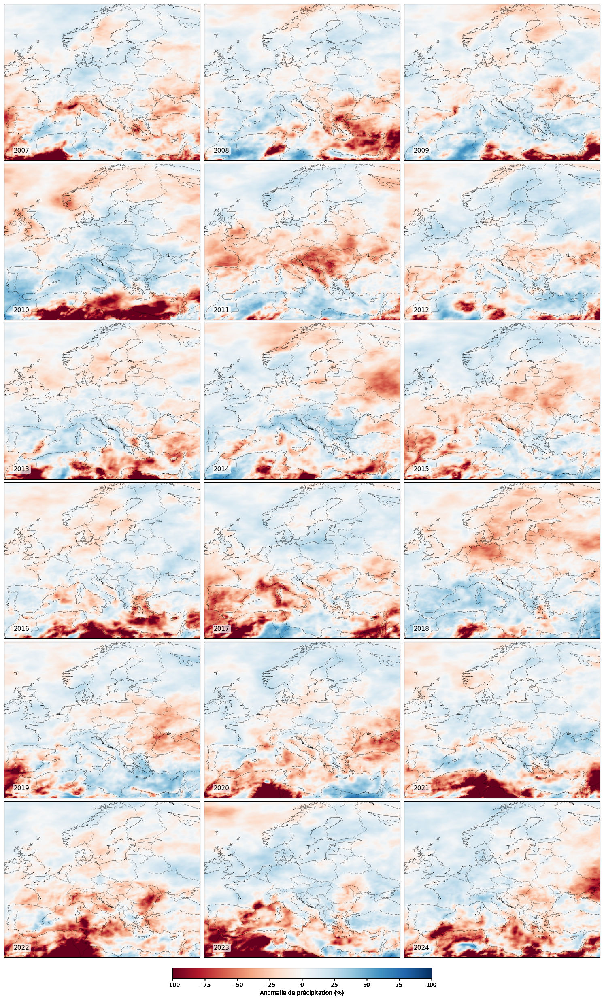

In [22]:
climatologie = calculer_moyenne()
fig = tracer_tableau_precipitation(2007,climatologie)

In [28]:
fig.savefig(Path(répertoire_principal) / 'anomalies_precipitation_2007-2024.png',dpi= 200, bbox_inches = 'tight')

## carte seule

* J'ai trouvé le fichier D:\Data\data_copernicus\precipitation_monthly\era5_precip_2011.nc et l'ai chargé.
* Anomalies 2011 calculées :
   - Résolution: 161 x 201 points
   - Valeurs  min et max: 10.5 mm et 3934.1 mm
   - Anomalies min et max: -1065.2 mm et 924.5 mm
   - Anomalies relatives min et max: -126.2 % et 53.0 %


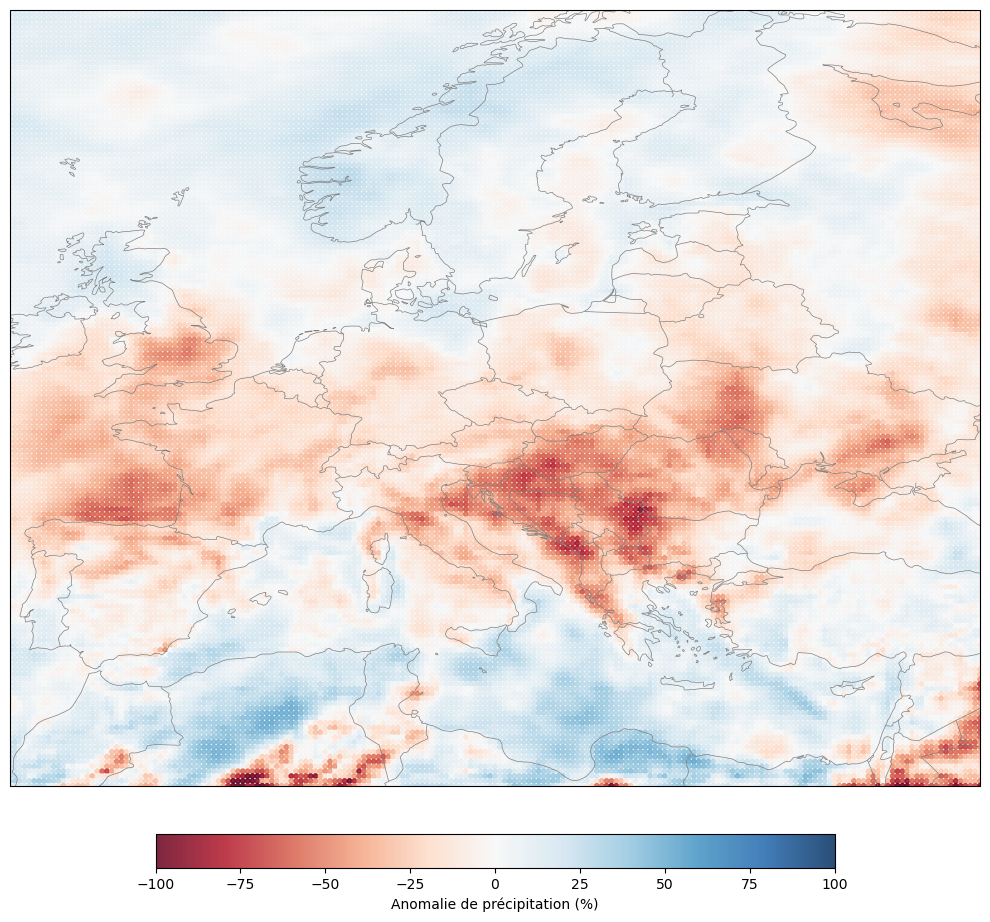

In [32]:

data, _, _ = calculer_anomalie_precipitation(2011, climatologie)
tracer_precipitation_anomalies(data)


## mosaïque de 2*2

In [ ]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, subplot_kw={'projection': ccrs.PlateCarree()}, constrained_layout=True)  

lat_range = 70 - 30   
lon_range = 40 - (-10)   
aspect_ratio = lon_range / lat_range   

# Ajustez la taille de figure en conséquence
fig_height = 15
fig_width = fig_height * aspect_ratio * 2  

fig.set_figheight(10)
fig.set_figwidth(12)

# Ajustement fin des espacements
plt.subplots_adjust(
    left=0.08,
    right=0.92,
    top=0.92,
    bottom=0.08,
    wspace=0.25,     
    hspace=0.15      
)
# Espacement uniforme
#plt.subplots_adjust(wspace=0.15, hspace=0.15)
 
axes = (ax1, ax2, ax3, ax4)

### 2 ###
for i in range(4):
    an = 2010+i
    data, _ , _ = calculer_anomalie_precipitation(an, climatologie)
    tabuler_precipitation_anomalies(data, an, ax=axes[i] ) 
 
 

## mosaïque de 4*2

In [ ]:
 

fig = plt.figure(figsize=(12, 16), constrained_layout=True)
gs = gridspec.GridSpec(4, 2, 
                       left=0.08, right=0.92, top=0.95, bottom=0.05,
                       wspace=0.025, hspace=0.08)

axes = []
for i in range(8):
    row, col = divmod(i, 2)
    ax = fig.add_subplot(gs[row, col], projection=ccrs.PlateCarree())
    axes.append(ax)
for i in range(8):
    an = 2008+i
    data, _ , _ = calculer_anomalie_precipitation(an, climatologie,verbosité=False)
    tabuler_precipitation_anomalies(data, an, ax=axes[i] ) 

In [ ]:
fig.savefig("cartes_anomalies_precip_2008-2015.png",dpi=300,bbox_inches = 'tight')

# Mosaïque avec imshow (sans Cartopy)

### 1990-2024

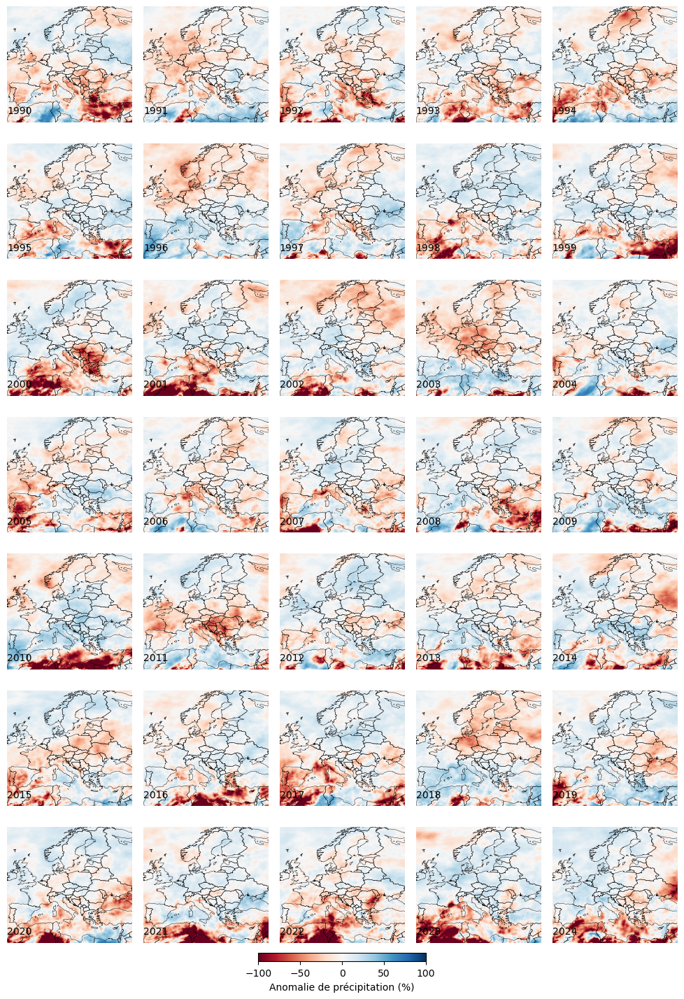

In [55]:
nrows, ncols = 7, 5
hgap, vgap = 0.01, 0.01
left, right = 0.05, 0.95
bottom, top = 0.05, 0.95

axes = []
width = (right - left - (ncols - 1) * hgap) / ncols
height = (top - bottom - (nrows - 1) * vgap) / nrows

#facteur_optimal = (lat_extent / lon_extent) * (figsize[0] / figsize[1]) * (nrows / ncols)
width *= 0.65  # compress horizontal
# à télécharger :  https://www.naturalearthdata.com/downloads/50m-cultural-vectors/
world = gpd.read_file(r"D:\Data\Cartographie\50m_cultural\ne_50m_admin_0_countries.shp")
world_europe = world.cx[-10:40, 30:70]

fig = plt.figure(figsize=(16, 16))

for i in range(nrows * ncols):
    row = i // ncols
    col = i % ncols
    x = left + col * (width + hgap) + 0.15 * width  # recentre
    y = top - (row + 1) * (height + vgap)
    ax = fig.add_axes([x, y, width, height])
    ax.set_xlim(-10, 40)
    ax.set_ylim(30, 70)
    ax.set_aspect("auto")
    ax.axis("off")
    axes.append(ax)

#axes = axes.flatten()

for i in range(nrows * ncols):
    ax = axes[i]
    an = 1990 + i
    data, _ , _ = calculer_anomalie_precipitation(an, climatologie, verbosité=False)

    # Conversion en DataFrame
    df = pd.DataFrame(data)
    df = df.round({'lat': 3, 'lon': 3})
    pivot = df.pivot(index='lat', columns='lon', values='anomalie')

    anom = pivot.values
    lon = pivot.columns.values
    lat = pivot.index.values

    im = ax.imshow(anom, origin='lower',
                   extent=[lon.min(), lon.max(), lat.min(), lat.max()],
                   cmap='RdBu', vmin=-100, vmax=100, aspect='auto')
    
     
    ax.set_xlim(-10, 40)
    ax.set_ylim(30, 70)
    ax.set_aspect('auto')

    # Tracer les frontières (attention aux limites du zoom)
    world_europe.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=0.3)

    #ax.set_title(str(an), fontsize=10)
    ax.text(0.1, 0.1,  str(an),
            horizontalalignment='center',
            verticalalignment='center',
            transform = ax.transAxes,fontsize=10)

    ax.set_xlim(lon.min(), lon.max())
    ax.set_ylim(lat.min(), lat.max())
    ax.axis('off')

# Colorbar
cbar = fig.colorbar(im, ax=axes, orientation='horizontal',shrink=0.25,
                    fraction=0.05, pad=0.01)
cbar.set_label("Anomalie de précipitation (%)")

plt.show()


In [35]:
fig.savefig(Path(répertoire_principal) / "carte_anomalies_precip_1990_2024.png",dpi=200,bbox_inches = 'tight')

### 1955-1989

In [ ]:
 
nrows, ncols = 7, 5
hgap, vgap = 0.01, 0.01
left, right = 0.05, 0.95
bottom, top = 0.05, 0.95

axes = []
width = (right - left - (ncols - 1) * hgap) / ncols
height = (top - bottom - (nrows - 1) * vgap) / nrows

#facteur_optimal = (lat_extent / lon_extent) * (figsize[0] / figsize[1]) * (nrows / ncols)
width *= 0.65  # compress horizontal
 
world = gpd.read_file(r"D:\Data\Cartographie\50m_cultural\ne_50m_admin_0_countries.shp")
world_europe = world.cx[-10:40, 30:70]

fig = plt.figure(figsize=(16, 16))

for i in range(nrows * ncols):
    row = i // ncols
    col = i % ncols
    x = left + col * (width + hgap) + 0.15 * width  # recentre
    y = top - (row + 1) * (height + vgap)
    ax = fig.add_axes([x, y, width, height])
    ax.set_xlim(-10, 40)
    ax.set_ylim(30, 70)
    ax.set_aspect("auto")
    ax.axis("off")
    axes.append(ax)

for i in range(nrows * ncols):
    ax = axes[i]
    an = 1955 + i
    data, _ , _ = calculer_anomalie_precipitation(an, climatologie, verbosité=False)

    # Conversion en DataFrame
    df = pd.DataFrame(data)
    df = df.round({'lat': 3, 'lon': 3})
    pivot = df.pivot(index='lat', columns='lon', values='anomalie')
    anom = pivot.values
    lon = pivot.columns.values
    lat = pivot.index.values

    im = ax.imshow(anom, origin='lower',
                   extent=[lon.min(), lon.max(), lat.min(), lat.max()],
                   cmap='RdBu', vmin=-100, vmax=100, aspect='auto')
    
    ax.set_xlim(-10, 40)
    ax.set_ylim(30, 70)
    ax.set_aspect('auto')

    # Tracer les frontières (attention aux limites du zoom)
    world_europe.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=0.3)

    #ax.set_title(str(an), fontsize=10)


    ax.text(0.1, 0.1,  str(an),
            horizontalalignment='center',
            verticalalignment='center',
            transform = ax.transAxes,fontsize=10)

    ax.set_xlim(lon.min(), lon.max())
    ax.set_ylim(lat.min(), lat.max())
    ax.axis('off')

# Colorbar
cbar = fig.colorbar(im, ax=axes, orientation='horizontal',shrink=0.25,
                    fraction=0.05, pad=0.01)
cbar.set_label("Anomalie de précipitation (%)")

plt.show()


In [37]:

fig.savefig(Path(répertoire_principal) / "carte_anomalies_precip_1955_1989.png",dpi=200,bbox_inches = 'tight')

## grilles lat/lon

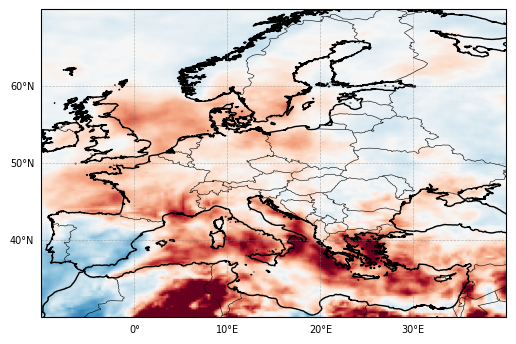

In [38]:

import matplotlib.ticker as mticker

fig, ax = plt.subplots(figsize=(6, 4), subplot_kw={'projection': ccrs.PlateCarree()})

ax.set_extent([-10, 40, 30, 70], crs=ccrs.PlateCarree())
ax.coastlines(resolution='10m')
ax.add_feature(cfeature.BORDERS, linewidth=0.4)

gl = ax.gridlines(crs=ccrs.PlateCarree(),
                  draw_labels=True,
                  linewidth=0.5,
                  color='gray',
                  alpha=0.5,
                  linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlocator = mticker.FixedLocator(np.arange(-10, 45, 10))
gl.ylocator = mticker.FixedLocator(np.arange(30, 75, 10))
gl.xlabel_style = {'size': 7}
gl.ylabel_style = {'size': 7}

data, _ , _ = calculer_anomalie_precipitation(an, climatologie, verbosité=False)
df = pd.DataFrame(data)
df = df.round({'lat': 3, 'lon': 3})
pivot = df.pivot(index='lat', columns='lon', values='anomalie')
anom = pivot.values
lon = pivot.columns.values
lat = pivot.index.values

im = ax.imshow(anom, origin='lower',
                extent=[lon.min(), lon.max(), lat.min(), lat.max()],
                cmap='RdBu', vmin=-100, vmax=100, aspect='auto')

# ax.set_xlim(-10, 40)
# ax.set_ylim(30, 70)
# ax.set_aspect('auto')


# Animation

In [51]:
def calculer_anomalie_precipitation_mensuelle(an, moyenne, extension=(30, 70, -10, 40), 
                                  répertoire = répertoire_animation,  verbosité = True):
    """
    Calcule les anomalies de précipitation pour une année donnée par rapport à la climatologie fournie.
    Entrée : 
    * année : integer (entre 1940 et 2025)
    * moyenne : xarray avec le cumul moyen de précipitations
    Sortie :
    * data_anomalies : dictionnaire ()
    """
    nom_fichier_complet = Path(répertoire) / f"era5_precip_{an}.nc"

    if not os.path.exists(nom_fichier_complet):
        print(f"* Téléchargement des données ERA5 pour {an}...")
        import cdsapi
        c = cdsapi.Client()
        c.retrieve(
            "reanalysis-era5-single-levels-monthly-means",
            {
                "product_type": "monthly_averaged_reanalysis",
                "variable": "total_precipitation",
                "year": str(an),
                "month": [f"{mois:02d}" for mois in range(1, 13)],
                "time": "00:00",
                "format": "netcdf",
                "area": extension
            },
            nom_fichier_complet
        )
    else:
        if verbosité: print(f"* J'ai trouvé le fichier {nom_fichier_complet} et l'ai chargé.")

    ds = xr.open_dataset(nom_fichier_complet)
    ds.load()
    # Créer un DataArray avec le nombre de jours par mois
    nb_jours_da = xr.DataArray(
        jours_par_mois(an), 
        dims=['valid_time'], 
        coords=[ds.valid_time]
    )

    # Conversion directe
    ds['tp_mm_total'] = ds['tp'] * 1000 * nb_jours_da
    ds['tp_mm_total'].attrs['units'] = 'mm/month'

    # Calculer l'anomalie mois par mois
    def anomalie_mensuelle(groupe):
        mois = groupe.valid_time.dt.month[0].item()
        return (1-groupe/ moyenne.sel(month=mois)) *100
 
    # Groupement par mois et calcul de l'anomalie
    precip_mensuelle = ds['tp_mm_total']
    anomalies = precip_mensuelle.groupby('valid_time.month').apply(anomalie_mensuelle)
    time_coord = 'valid_time'
    # Noms lat/lon
    lat_name = "latitude" if "latitude" in ds.coords else "lat"
    lon_name = "longitude" if "longitude" in ds.coords else "lon"

    # Recadrer sur l'Europe si besoin est
    lat_min, lat_max, lon_min, lon_max = extension 
    # lat ERA5 décroissante -> slice(lat_max, lat_min) !!! Attention format CDS
    ds = ds.sel({lat_name: slice(lat_max, lat_min),
                 lon_name: slice(lon_min, lon_max)})
    anomalies = anomalies.transpose(time_coord, lat_name, lon_name)
    ds.close()
    return anomalies
# ---  Animation Europe (PlateCarree) --- 
# à faire avec Robinson

def make_animation(climato, années=range(2000, 2026),
                   data_dir=répertoire_animation,
                   area_crop=(30, 70, -10, 40),
                   vmin=-100, vmax=100):
    """
    Construit l'animation mensuelle des anomalies precip (tp) sur l'Europe.
    """
    # Accumuler toutes les cartes mensuelles (12 * nb années)
    all_months = []
    labels     = []
    lat_name   = None
    lon_name   = None

    for an in années:
        da_année = calculer_anomalie_precipitation_mensuelle(an,climato)
        # Mémoriser noms lat/lon
        if lat_name is None:
            lat_name = "latitude" if "latitude" in da_année.coords else "lat"
            lon_name = "longitude" if "longitude" in da_année.coords else "lon"

        # Itérer sur la dimension temps (12 mois)
        for month_idx in range(da_année.sizes[da_année.dims[0]]):
            da = da_année.isel({da_année.dims[0]: month_idx})
            # On stocke seulement la grille 2D (lat, lon)
            all_months.append(da)
            labels.append(f"{an}-{month_idx+1:02d}")

        # libérer mémoire pour l'année
        del da_année

    # Prépare la figure/projection
    fig = plt.figure(figsize=(8, 8))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([area_crop[2], area_crop[3], area_crop[0], area_crop[1]], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.COASTLINE, lw=0.6, edgecolor='gray')
    ax.add_feature(cfeature.BORDERS, lw=0.4, edgecolor='gray')
    # Grilles coordonnées
    lats = all_months[0][lat_name].values
    lons = all_months[0][lon_name].values

    # Premier champ
    Z0 = all_months[0].values
    # pcolormesh attend (nlat-1) x (nlon-1) en interne
    pcm = ax.pcolormesh(lons, lats, Z0, cmap='RdBu', vmin=vmin, vmax=vmax,
                        transform=ccrs.PlateCarree(),alpha = 0.7)
    cb = fig.colorbar(pcm, orientation='horizontal', fraction=0.05, pad=0.04)
    cb.set_label("Anomalie des précipitations (%)")
    title = ax.set_title(labels[0])

    def update(i):
        Zi = all_months[i].values
        # Mise à jour des données: QuadMesh attend (nlat-1)*(nlon-1) éléments
        pcm.set_array(Zi.ravel())
        title.set_text(labels[i])
        return pcm, title

    ani = FuncAnimation(fig, update, frames=len(all_months), interval=200, blit=False)
    return ani


In [52]:

clim = calculer_moyenne(fichier=Path(répertoire_animation) / 'era5_precip_climatology_1991_2020.nc',
                        extension=[70, -10, 30, 40])
ani = make_animation(climato=clim,
                     années=range(2005, 2025),
                     data_dir=répertoire_animation,
                     area_crop=(30, 70, -10, 40),
                     vmin=-100,vmax=100)
plt.close()   # évite l’affichage de la 1ère frame statique
ani

J'ai créé le répertoire :  D:\Data\data_copernicus\precipitation_monthly
* J'ai trouvé le fichier D:\Data\data_copernicus\data_animation\precipitation\era5_precip_climatology_1991_2020.nc et l'ai chargé...
* Unité initiale de la variable tp : m
* Période de référence: 1991-2021
* Nombre moyen de jours en février (sur la période 1991-2021): 28.27
* Unité finale : mm/month
* J'ai trouvé le fichier D:\Data\data_copernicus\data_animation\precipitation\era5_precip_2005.nc et l'ai chargé.
* J'ai trouvé le fichier D:\Data\data_copernicus\data_animation\precipitation\era5_precip_2006.nc et l'ai chargé.
* J'ai trouvé le fichier D:\Data\data_copernicus\data_animation\precipitation\era5_precip_2007.nc et l'ai chargé.
* J'ai trouvé le fichier D:\Data\data_copernicus\data_animation\precipitation\era5_precip_2008.nc et l'ai chargé.
* J'ai trouvé le fichier D:\Data\data_copernicus\data_animation\precipitation\era5_precip_2009.nc et l'ai chargé.
* J'ai trouvé le fichier D:\Data\data_copernicus\data_an

In [54]:
ani.save(Path(répertoire_principal) / 'anomalies_2005_2024_precip.mp4', writer='ffmpeg', dpi=180, fps=2,
         extra_args=['-vcodec', 'libx264'])

In [ ]:
ani.save(Path(répertoire_principal) / 'anomalies_2005_2024_precip.gif', writer='imagemagick', dpi=120)

MovieWriter imagemagick unavailable; using Pillow instead.
